## Introduzione
Caricamento dataset e modifiche iniziali

In [ ]:
from google.colab import drive

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
# Importiamo tutte le librerie necessarie per il progetto
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import keras
import scipy.stats as st
from keras.models import Sequential
from keras.layers import Dense
from time import time
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, roc_auc_score
from sklearn.model_selection import KFold, StratifiedKFold, GridSearchCV, train_test_split
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
df = pd.read_csv("drive/MyDrive/smoking.csv", sep=",")

Per il progetto è stato selezionato un dataset con vari attributi diversificati, tra cui genere, altezza, peso, valore di emoglobina, e altri ancora. L'obiettivo primario dei modelli che andremo a sviluppare è predire se un individuo è un fumatore o meno.

In [ ]:
df.head()

,ID,gender,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),...,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,oral,dental caries,tartar,smoking
0,0,F,40,155,60,81.3,1.2,1.0,1.0,1.0,...,12.9,1.0,0.7,18.0,19.0,27.0,Y,0,Y,0
1,1,F,40,160,60,81.0,0.8,0.6,1.0,1.0,...,12.7,1.0,0.6,22.0,19.0,18.0,Y,0,Y,0
2,2,M,55,170,60,80.0,0.8,0.8,1.0,1.0,...,15.8,1.0,1.0,21.0,16.0,22.0,Y,0,N,1
3,3,M,40,165,70,88.0,1.5,1.5,1.0,1.0,...,14.7,1.0,1.0,19.0,26.0,18.0,Y,0,Y,0
4,4,F,40,155,60,86.0,1.0,1.0,1.0,1.0,...,12.5,1.0,0.6,16.0,14.0,22.0,Y,0,N,0


Si è deciso di ridurre la dimensione del dataset da oltre 50.000 a 10.000 valori al fine di ottimizzare i tempi di addestramento dei modelli, garantendo così una maggiore efficienza nel processo di analisi e sviluppo. È importante sottolineare che nonostante questa riduzione, il rapporto tra i valori delle due classi della colonna target rimane invariato, mantenendo l'integrità e la rappresentatività dei dati.

In [ ]:
original_counts = df['smoking'].value_counts()
print("Counts nel dataset originale:\n", original_counts)
print("Rapporto:\n", original_counts[0]/original_counts[1])

df = df[:10000]

sampled_counts = df['smoking'].value_counts()
print("\nCounts nel dataset partizionato:\n", sampled_counts)
print("Rapporto:\n", sampled_counts[0]/sampled_counts[1])

Counts nel dataset originale:
 0    35237
1    20455
Name: smoking, dtype: int64
Rapporto:
 1.7226594964556343

Counts nel dataset partizionato:
 0    6384
1    3616
Name: smoking, dtype: int64
Rapporto:
 1.7654867256637168


Innanzitutto eliminiamo la colonna "ID" in quanto non è indicativa per il nostro target: "smoking"

In [ ]:
df = df.drop(['ID'], axis=1)

In [ ]:
df.dtypes

gender                  object
age                      int64
height(cm)               int64
weight(kg)               int64
waist(cm)              float64
eyesight(left)         float64
eyesight(right)        float64
hearing(left)          float64
hearing(right)         float64
systolic               float64
relaxation             float64
fasting blood sugar    float64
Cholesterol            float64
triglyceride           float64
HDL                    float64
LDL                    float64
hemoglobin             float64
Urine protein          float64
serum creatinine       float64
AST                    float64
ALT                    float64
Gtp                    float64
oral                    object
dental caries            int64
tartar                  object
smoking                  int64
dtype: object

Per semplificare il processo di analisi e trattamento dei dati, abbiamo convertito le colonne che originariamente contenevano solo valori "M/F" o "Y/N" in un formato binario utilizzando la codifica 0/1. Questa trasformazione consente una maggiore uniformità e facilità di manipolazione dei dati durante le fasi di elaborazione e modellazione. Anziché gestire valori testuali come "M" o "F", ora possiamo utilizzare valori numerici come 1 per "M" e 0 per "F", e 1 per "Y" e 0 per "N".

In [ ]:
df['tartar'] = df['tartar'].apply(lambda x: 1 if x == 'Y' else 0)
df['gender'] = df['gender'].apply(lambda x: 1 if x == 'M' else 0)
df['oral'] = df['oral'].apply(lambda x: 1 if x == 'Y' else 0)

In [ ]:
df.dtypes

gender                   int64
age                      int64
height(cm)               int64
weight(kg)               int64
waist(cm)              float64
eyesight(left)         float64
eyesight(right)        float64
hearing(left)          float64
hearing(right)         float64
systolic               float64
relaxation             float64
fasting blood sugar    float64
Cholesterol            float64
triglyceride           float64
HDL                    float64
LDL                    float64
hemoglobin             float64
Urine protein          float64
serum creatinine       float64
AST                    float64
ALT                    float64
Gtp                    float64
oral                     int64
dental caries            int64
tartar                   int64
smoking                  int64
dtype: object

## Analisi covariate

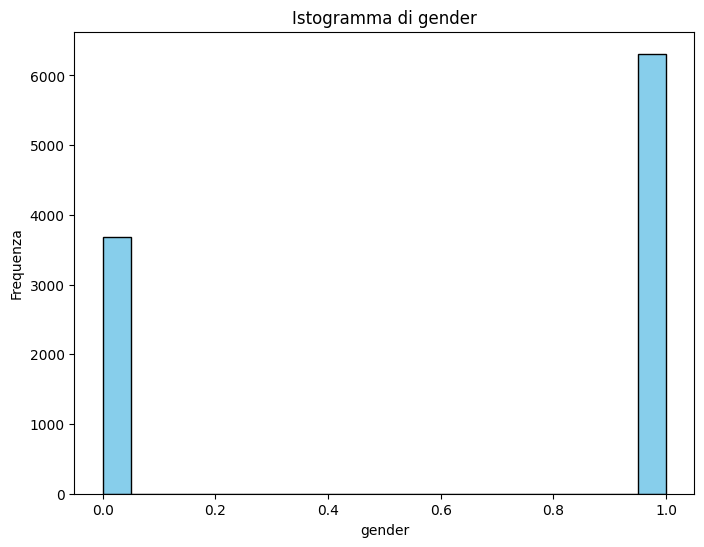

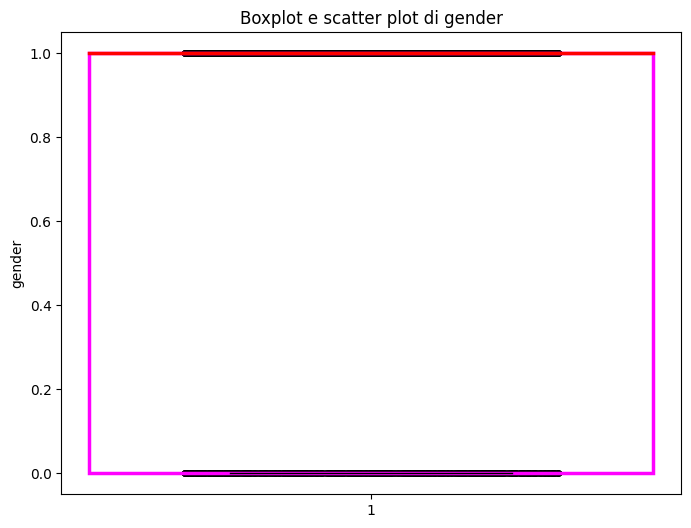

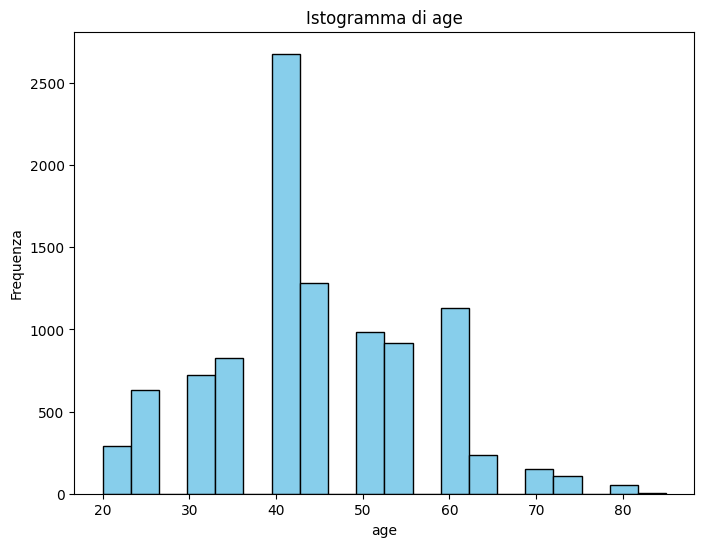

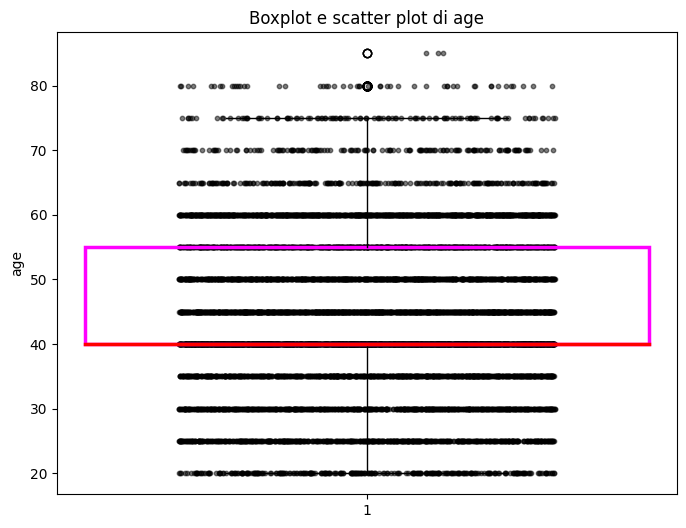

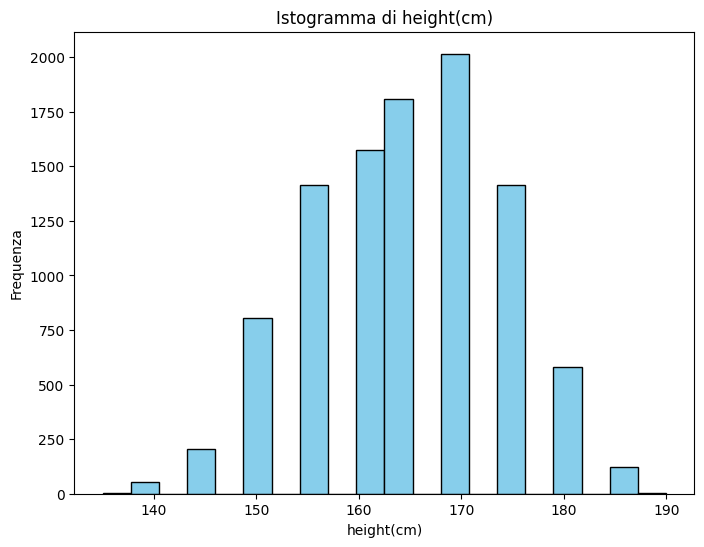

...

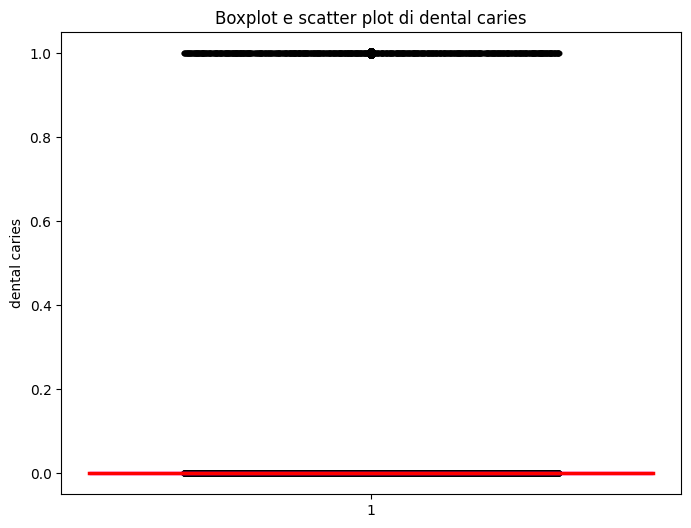

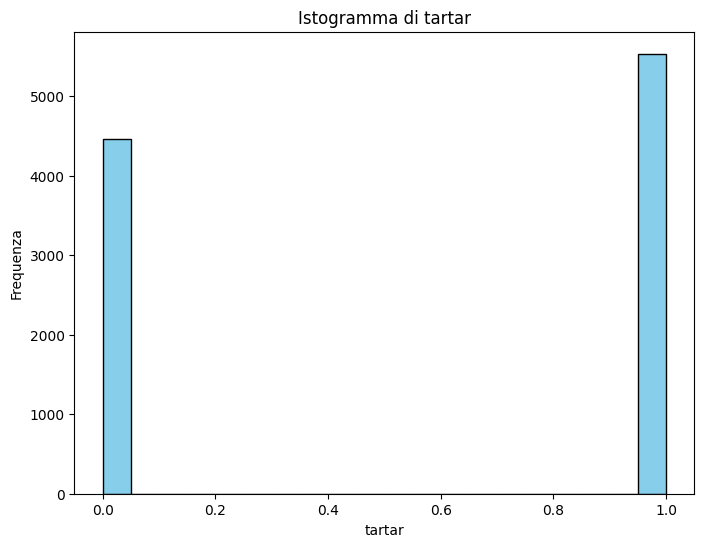

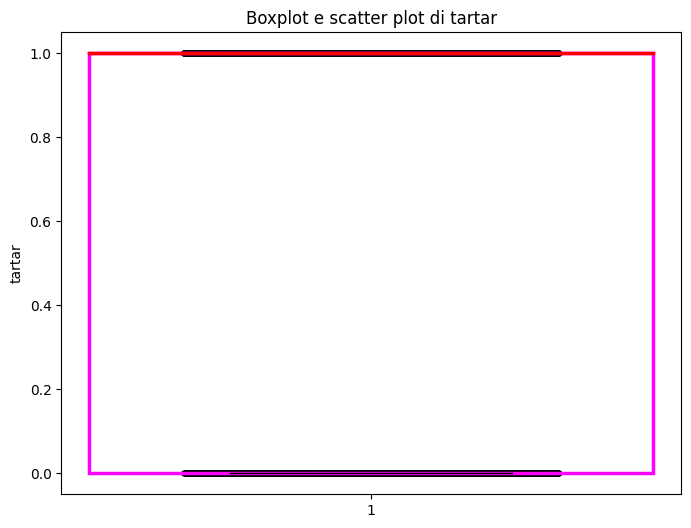

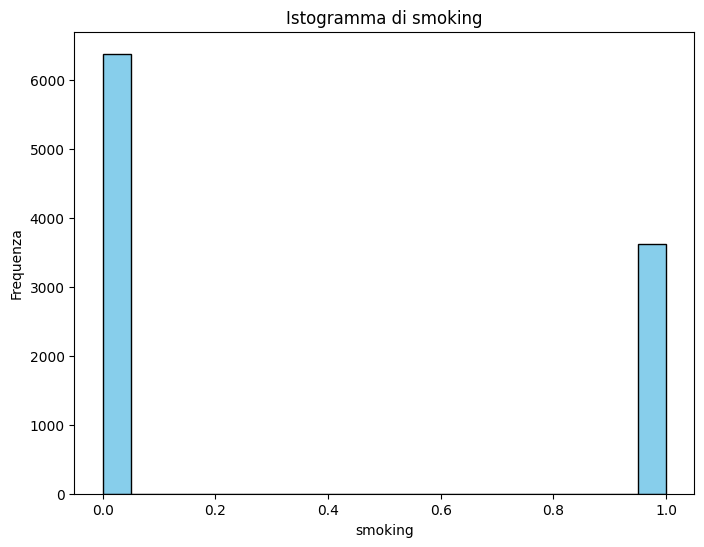

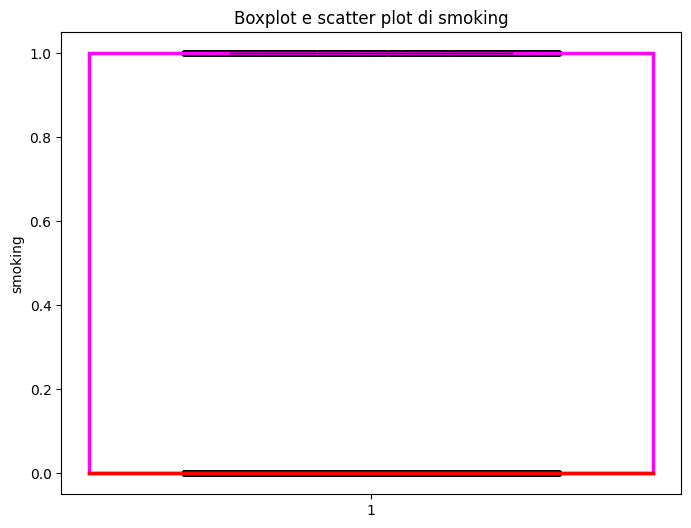

In [ ]:
# Crea un istogramma e un boxplot per ogni colonna del dataset
for col in df.columns:
    # Istogramma
    plt.figure(figsize=(8, 6))
    plt.hist(df[col], bins=20, color='skyblue', edgecolor='black')
    plt.title(f'Istogramma di {col}')
    plt.xlabel(col)
    plt.ylabel('Frequenza')
    plt.show()

    x_values = np.random.uniform(0.5, 1.5, size=len(df[col]))

    plt.figure(figsize=(8, 6), facecolor='white')

    # Boxplot (sovrapposto a scatter plot)
    plt.boxplot(df[col], widths=1.5, patch_artist=True,  boxprops=dict(edgecolor=(1.0, 0.0, 1.0), facecolor='none', linewidth=2.5), medianprops=dict(color='red', linewidth=2.5))

    # Scatter plot
    plt.scatter(x_values, df[col], s=10, color='black', alpha=0.5)

    plt.title(f'Boxplot e scatter plot di {col}')
    plt.ylabel(col)
    plt.show()

Dai grafici e dalla cella che segue, emerge chiaramente che la colonna "oral" presenta un'unica classe. Di conseguenza, possiamo procedere con la sua eliminazione poiché non fornisce alcuna informazione utile per il nostro scopo.

In [ ]:
print(df['oral'].unique())

[1]


In [ ]:
df = df.drop(['oral'], axis=1)

In [ ]:
attributi_binari = ['gender', 'hearing(left)', 'hearing(right)', 'dental caries', 'tartar']

attributi_continui = ['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST', 'ALT', 'Gtp']

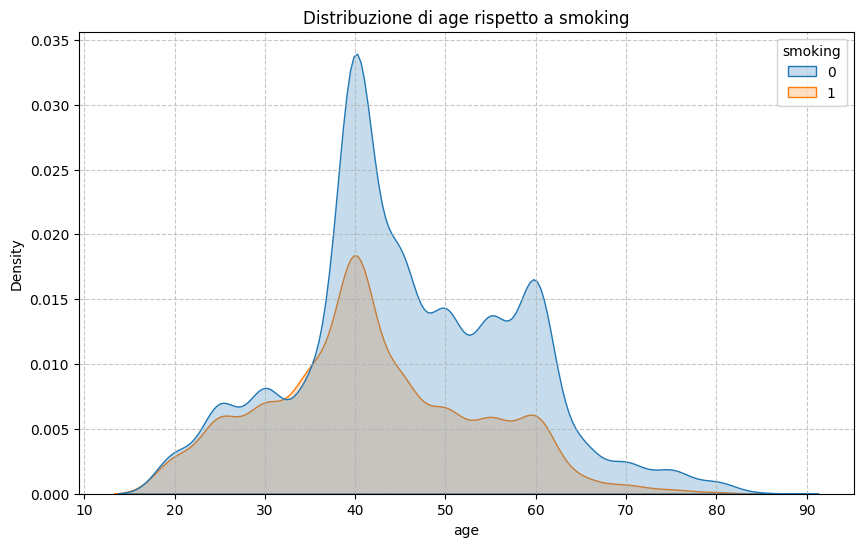

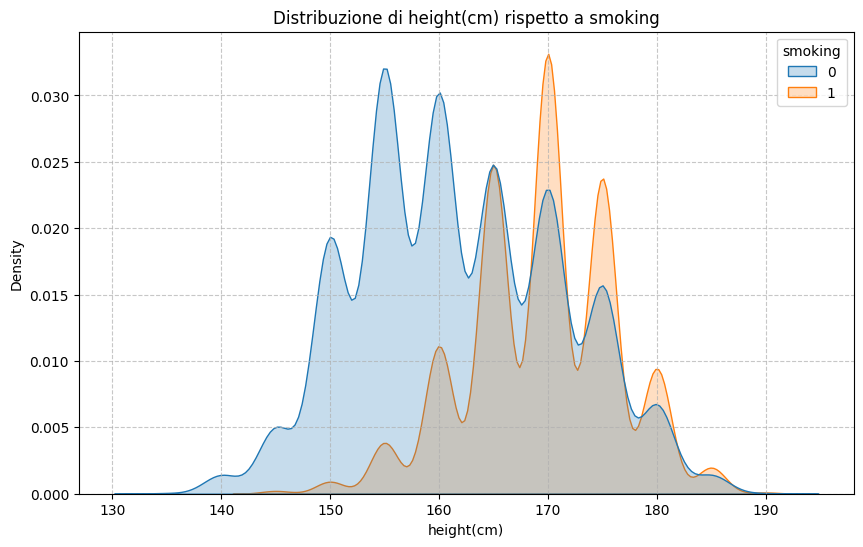

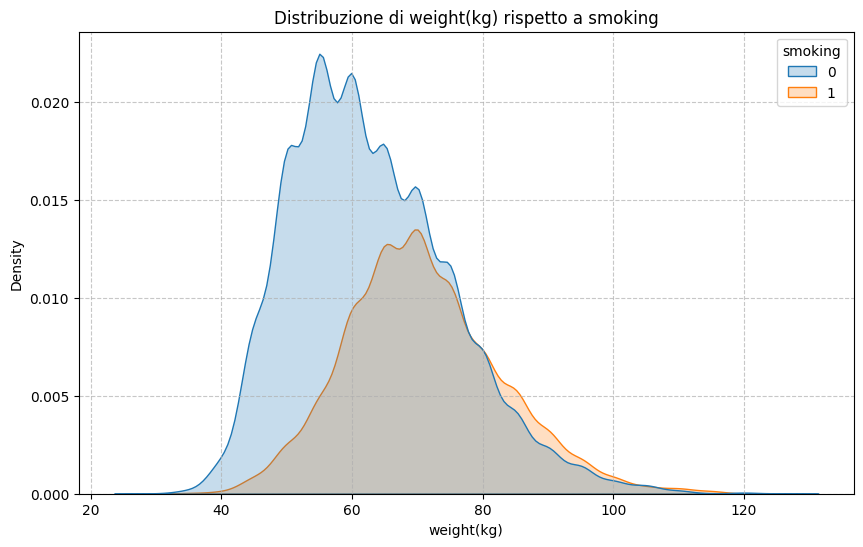

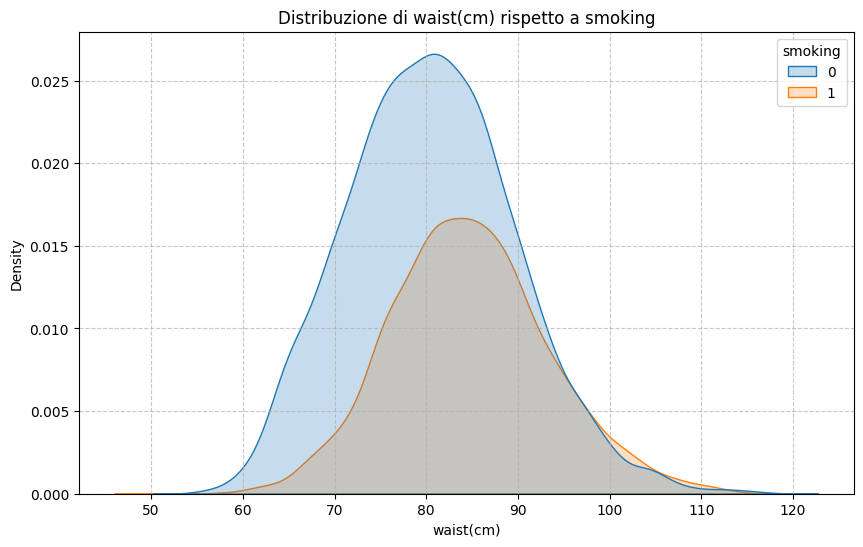

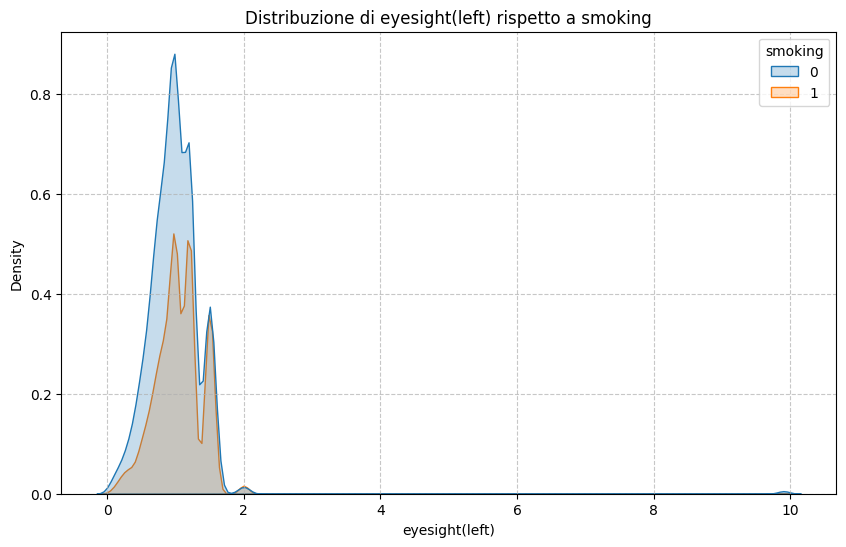

...

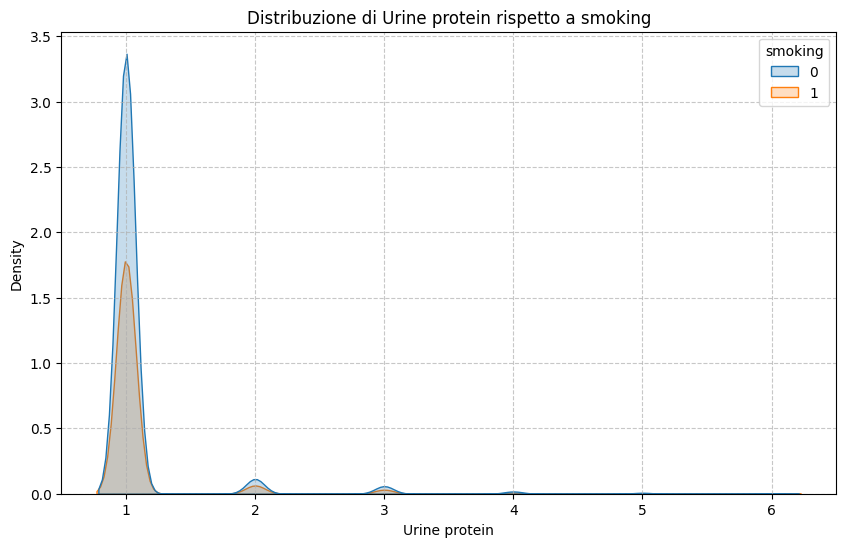

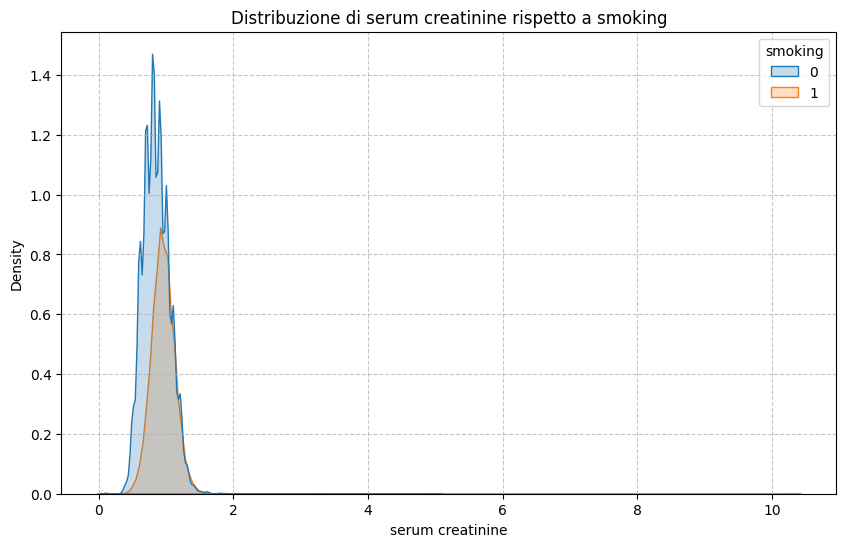

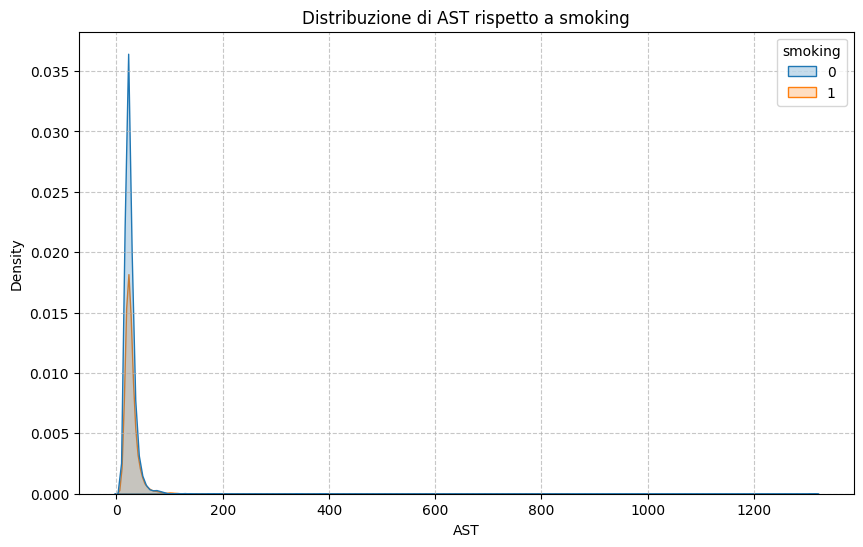

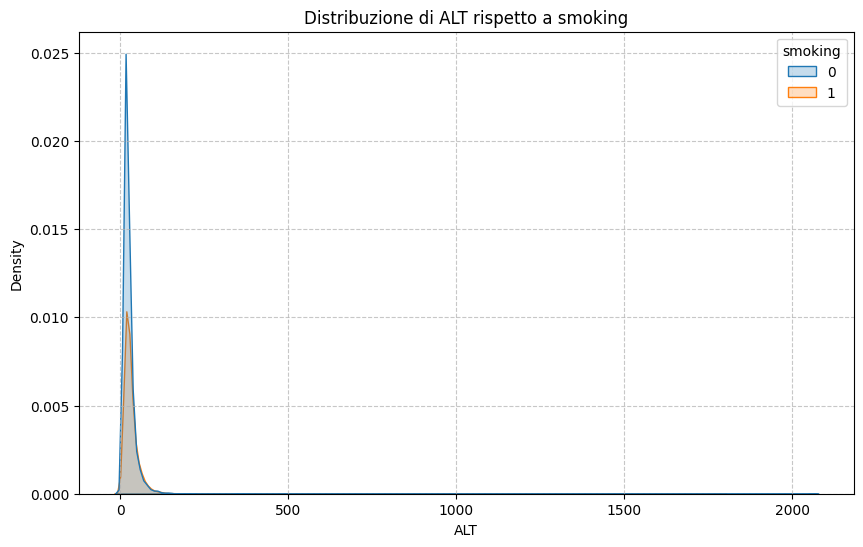

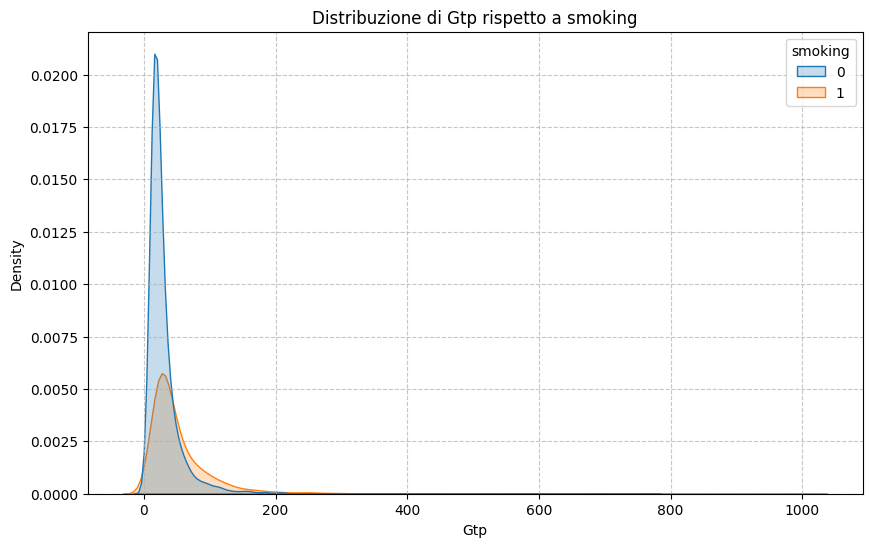

In [ ]:
# Creiamo i grafici bivariati per gli attributi continui
for attributo in attributi_continui:
    plt.figure(figsize=(10, 6))

    ax = plt.gca()
    ax.set_facecolor('white')
    ax.grid(True, linestyle='--', alpha=0.7)

    sns.kdeplot(data=df, x=attributo, hue='smoking', fill=True)
    plt.title(f'Distribuzione di {attributo} rispetto a smoking')
    plt.show()

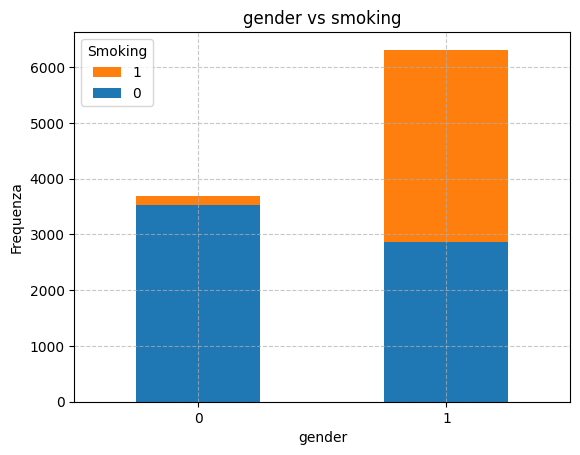

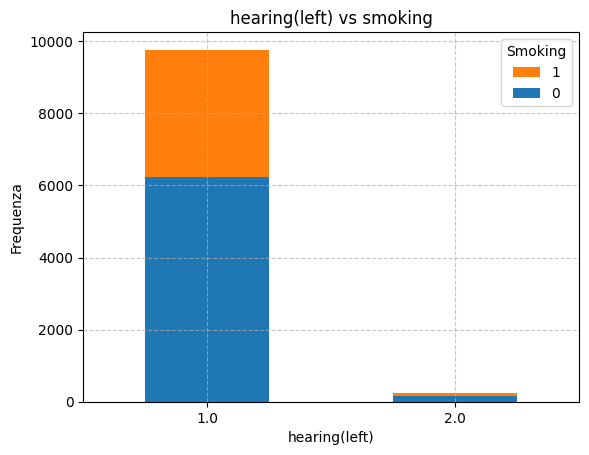

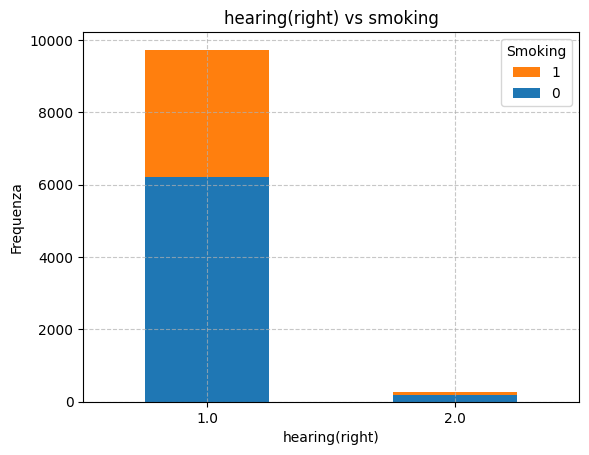

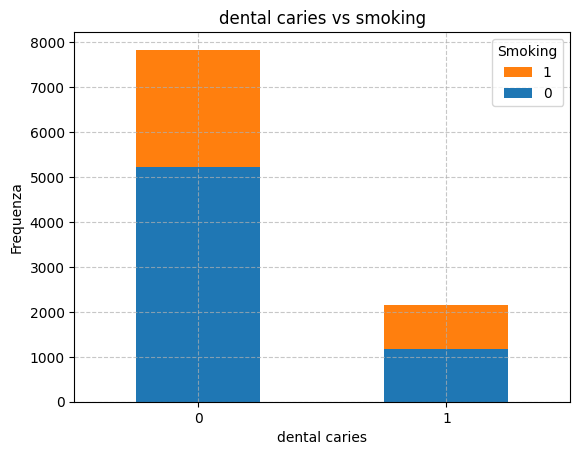

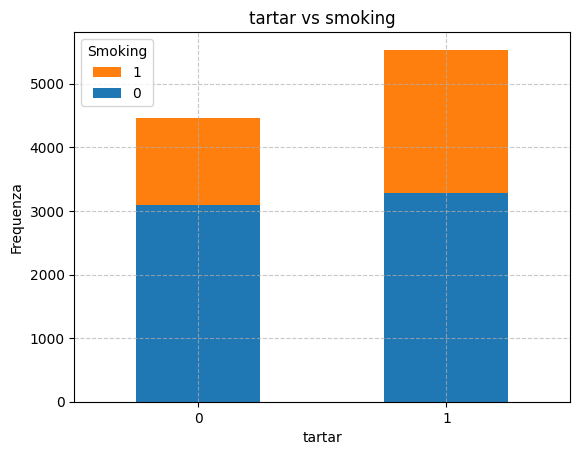

In [ ]:
# Creiamo i grafici bivariati per gli attributi che presentano solo due classi (in questo caso sotto forma di istogrammi per favorire la leggibilità)
for attributo in attributi_binari:
    grouped = df.groupby([attributo, 'smoking']).size().unstack()

    ax = grouped.plot(kind='bar', stacked=True)

    ax.set_facecolor('white')
    ax.grid(True, linestyle='--', alpha=0.7)

    ax.set_title(f'{attributo} vs smoking')
    ax.set_xlabel(f'{attributo}')
    ax.set_ylabel('Frequenza')

    ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1], title='Smoking')

    plt.show()

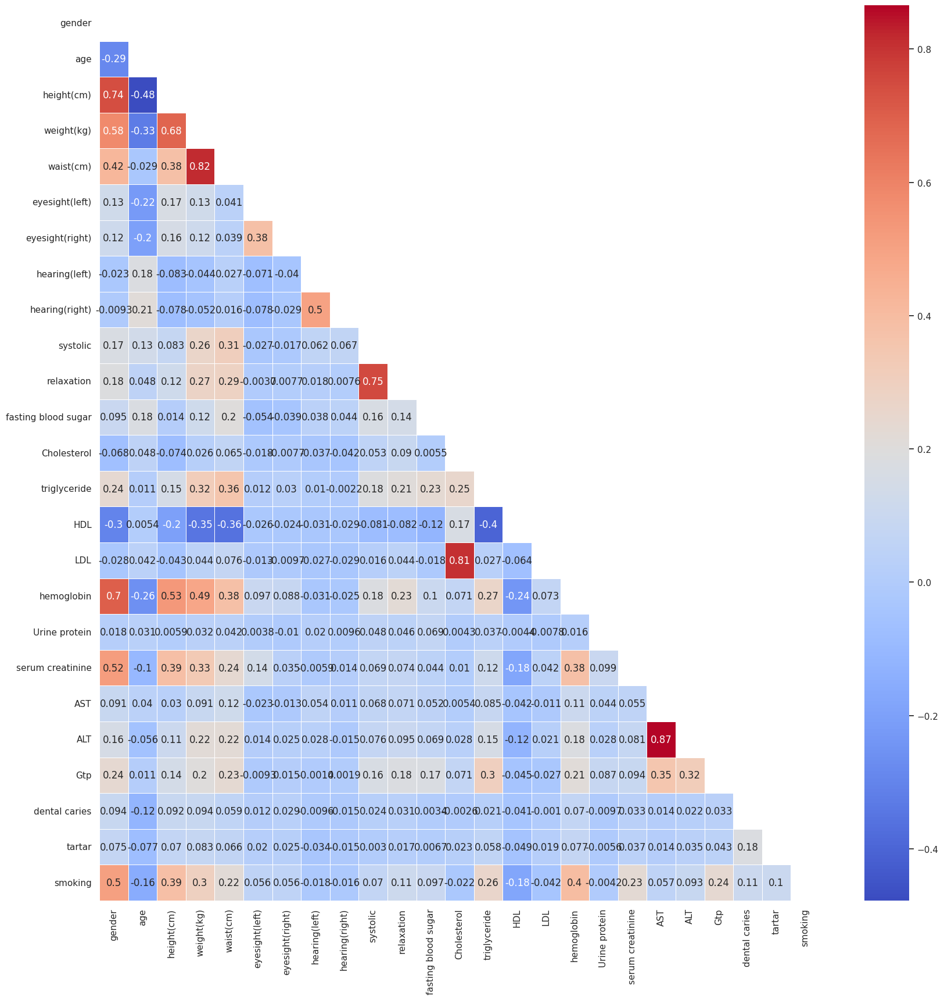

In [ ]:
# Calcoliamo la matrice di correlazione
correlation_matrix = df.corr()
sns.set(style="white")
plt.figure(figsize=(20, 20))

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5, mask=mask)

plt.show()

Notiamo:

- forte correlazione positiva tra gender, height, weight, waist, triglyceride, hemoglobin, serum creatinine, gtp e la variabile target

- forte correlazione negativa tra hdl e variabile target

Notiamo che le covariate "Hearing (Left)" e "Hearing (Right)" non presentano una correlazione marcata con altre covariate, ad eccezione della reciproca correlazione positiva. Pertanto, procediamo con l'esclusione di queste dai modelli che verranno addestrati.

In [ ]:
df = df.drop(['hearing(left)','hearing(right)'], axis=1)

## PCA

Dato l'elevato numero di attributi nel dataset, intendiamo ridurre la sua dimensionalità identificando le componenti principali che catturano la maggior parte della variazione dei dati.

In [ ]:
# Escludiamo tutte le colonne con valori binari (target incluso)
variabili_pca = list(df.columns[1:-1])
variabili_pca.remove('tartar')
variabili_pca.remove('dental caries')

print(variabili_pca)

['age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)', 'eyesight(right)', 'systolic', 'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride', 'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST', 'ALT', 'Gtp']


In [ ]:
# Standardizziamo le colonne su cui andiamo a lavorare
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[variabili_pca])
scaled_data

array([[-0.3498111 , -1.03837089, -0.4533991 , ..., -0.39343963,
        -0.23810499, -0.25219847],
       [-0.3498111 , -0.49670637, -0.4533991 , ..., -0.20048011,
        -0.23810499, -0.42709473],
       [ 0.89300428,  0.58662268, -0.4533991 , ..., -0.24871999,
        -0.32671648, -0.34936306],
       ...,
       [ 1.30727608,  0.58662268, -0.06260518, ..., -0.39343963,
        -0.1494935 , -0.21333263],
       [-0.7640829 ,  0.04495816, -0.4533991 , ..., -0.48991939,
        -0.41532798, -0.40766182],
       [-0.7640829 ,  1.1282872 ,  1.89136437, ..., -0.15224023,
        -0.23810499, -0.23276555]])

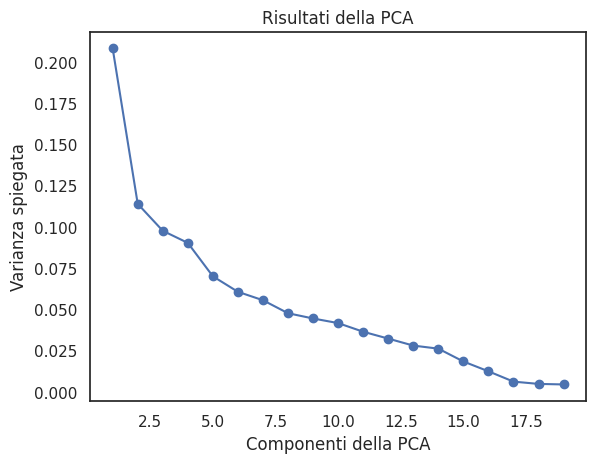

In [ ]:
pca = PCA().fit(scaled_data)

# Creiamo un grafico della varianza spiegata per ogni componente
plt.plot(range(1, pca.n_components_ + 1), pca.explained_variance_ratio_, marker='o')
plt.xlabel('Componenti della PCA')
plt.ylabel('Varianza spiegata')
plt.title("Risultati della PCA")
plt.show()

In [ ]:
# Calcolo della varianza spiegata e cumulativa
varianza_spiegata = pca.explained_variance_ratio_
varianza_cumulativa = varianza_spiegata.cumsum()

componenti_principali = [f"PC{i+1}" for i in range(len(varianza_spiegata))]
tabella_varianze = pd.DataFrame({'Componente Principale': componenti_principali,
                                 'Varianza Spiegata': varianza_spiegata,
                                 'Varianza Cumulativa': varianza_cumulativa})

print(tabella_varianze)

   Componente Principale  Varianza Spiegata  Varianza Cumulativa
0                    PC1           0.208137             0.208137
1                    PC2           0.113967             0.322104
2                    PC3           0.097651             0.419756
3                    PC4           0.090307             0.510062
4                    PC5           0.070064             0.580127
5                    PC6           0.060670             0.640797
6                    PC7           0.055567             0.696364
7                    PC8           0.047690             0.744055
8                    PC9           0.044509             0.788563
9                   PC10           0.041718             0.830282
10                  PC11           0.036478             0.866760
11                  PC12           0.032315             0.899075
12                  PC13           0.028088             0.927163
13                  PC14           0.026228             0.953391
14                  PC15 

In [ ]:
# Applichiamo la PCA per ridurre la dimensionalità dei dati
pca = PCA(n_components=9).fit(scaled_data)
pca_data = pca.transform(scaled_data)

print(pca.explained_variance_ratio_)

[0.20813703 0.11396734 0.0976512  0.09030691 0.07006428 0.06067012
 0.05556743 0.04769043 0.04450871]


Scegliendo 9 componenti principali otteniamo catturiamo circa l'80% della varianza totale.

In [ ]:
# Esaminiamo l'incidenza di ciascun attributo sulle componenti principali generate
pca_df = pd.DataFrame(abs(pca.components_[:9]), columns=variabili_pca,
                     index=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9'])
pca_df

,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp
PC1,0.132032,0.332761,0.424994,0.383119,0.081532,0.076073,0.218290,0.233334,0.125624,0.050521,0.263145,0.228648,0.044553,0.340710,0.043164,0.231224,0.158435,0.212947,0.214953
PC2,0.418054,0.342011,0.154807,0.033390,0.281001,0.245157,0.270957,0.246425,0.210244,0.273245,0.164258,0.030277,0.212344,0.127616,0.062355,0.157492,0.273653,0.228176,0.214925
PC3,0.010175,0.014191,0.066633,0.070079,0.021521,0.013783,0.119337,0.133518,0.010358,0.482181,0.092827,0.003550,0.484256,0.059617,0.033093,0.043878,0.484349,0.445318,0.205929
PC4,0.201471,0.032634,0.043295,0.106831,0.150871,0.148313,0.352019,0.304383,0.204720,0.435759,0.036020,0.134479,0.432255,0.049884,0.033635,0.039489,0.335847,0.345992,0.089597
PC5,0.138300,0.017261,0.075784,0.146430,0.353097,0.377543,0.435397,0.461491,0.170617,0.030245,0.242688,0.405757,0.043724,0.039645,0.003045,0.119146,0.084523,0.058831,0.042129
PC6,0.183943,0.226320,0.107216,0.005118,0.463708,0.519631,0.115052,0.125292,0.324202,0.003554,0.372529,0.275380,0.046721,0.158683,0.089591,0.129019,0.066001,0.051489,0.103307
PC7,0.056584,0.045728,0.087217,0.117275,0.045269,0.062763,0.053359,0.056533,0.168166,0.031459,0.099047,0.233694,0.019550,0.083728,0.820369,0.385367,0.047378,0.103980,0.160187
PC8,0.271461,0.147472,0.010399,0.099601,0.164590,0.024601,0.120280,0.071391,0.366248,0.111435,0.200401,0.437240,0.162912,0.116060,0.210226,0.267709,0.149928,0.169782,0.512056
PC9,0.299617,0.003998,0.172375,0.156982,0.179672,0.018193,0.012156,0.019612,0.369038,0.023744,0.188056,0.120398,0.020406,0.229218,0.491369,0.581400,0.048498,0.000166,0.036321


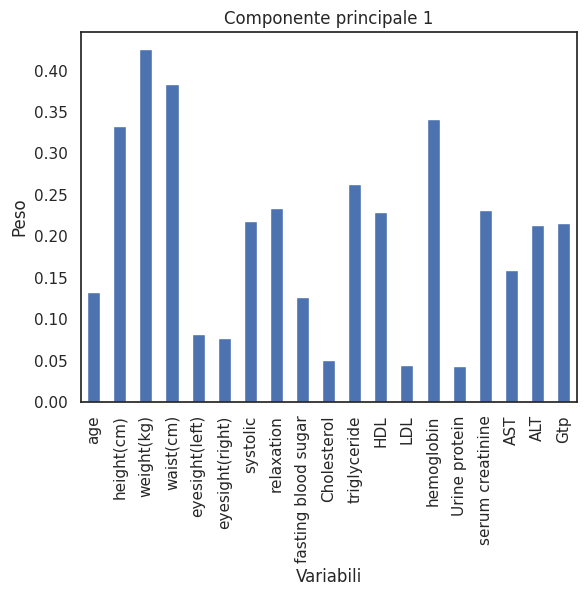

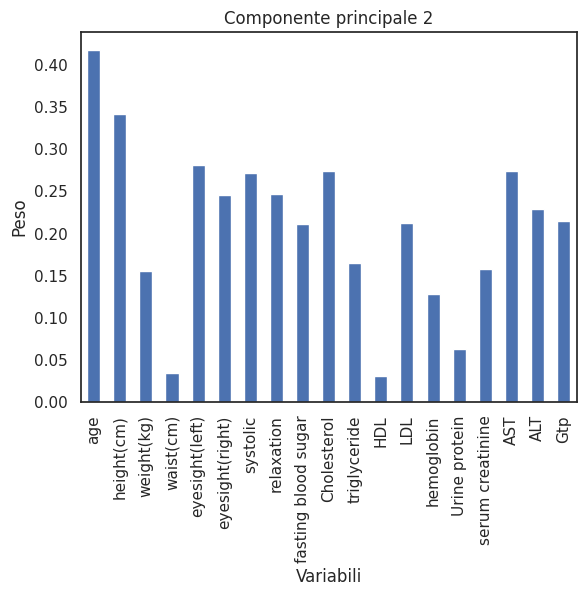

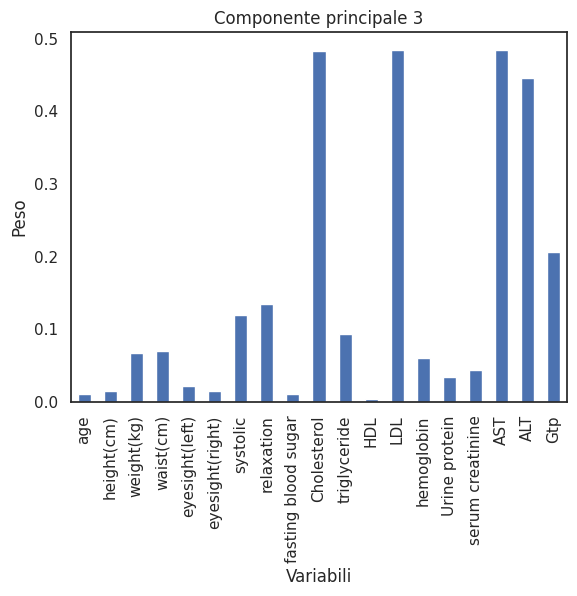

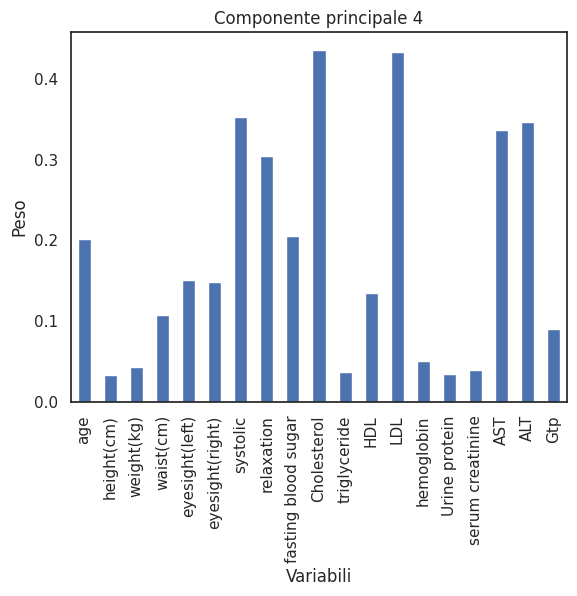

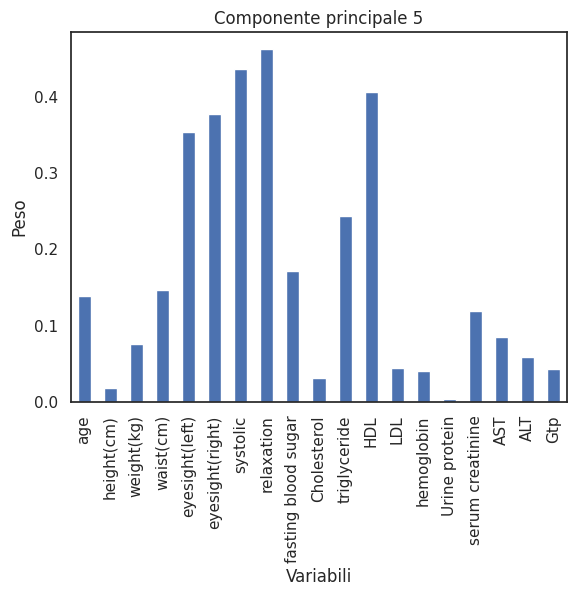

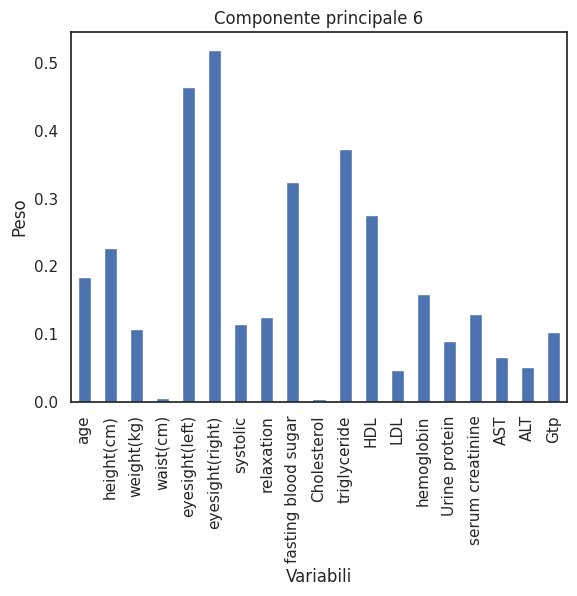

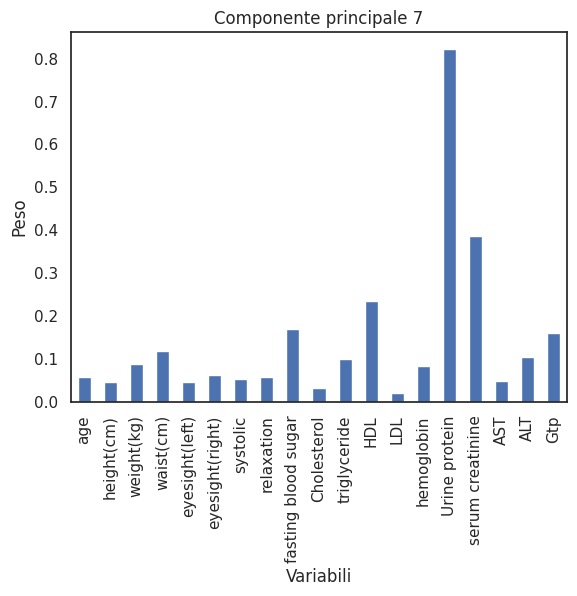

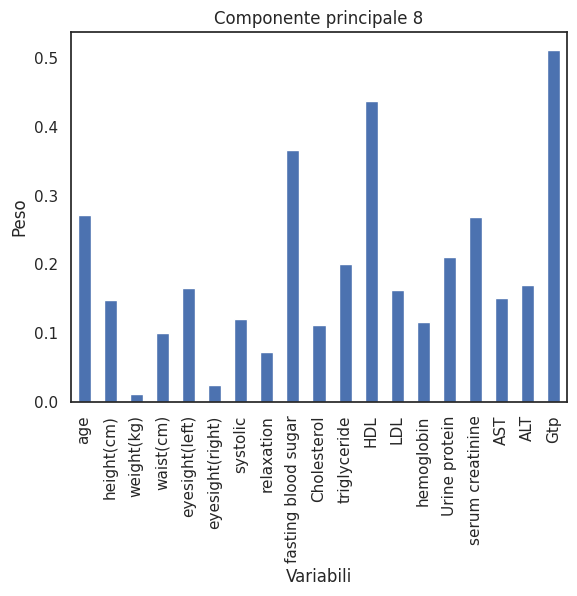

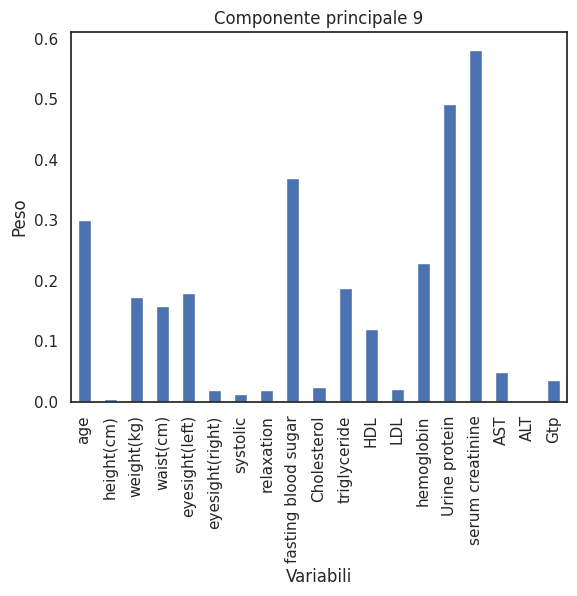

In [ ]:
# Vediamo anche graficamente l'incidenza degli attributi
for i in range(9):
    ax = pca_df.iloc[i].plot(kind='bar')
    ax.set_xlabel('Variabili')
    ax.set_ylabel('Peso')
    ax.set_title('Componente principale {}'.format(i+1))
    plt.show()

In [ ]:
# Creiamo un nuovo dataframe con le componenti principali
df_pca = pd.DataFrame(data = pca_data,
                      columns = ['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9'])

# Aggiungiamo le colonne con i valori binari che avevamo eliminato in precedenza, prima della PCA
df_pca['gender'] = df['gender']
df_pca['tartar'] = df['tartar']
df_pca['dental caries'] = df['dental caries']
df_pca['target'] = df['smoking']

In [ ]:
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,gender,tartar,dental caries,target
0,-1.821630,0.052115,-0.427430,0.649771,0.582712,0.167616,-0.262970,-0.340409,-0.438596,0,1,0,0
1,-1.150534,0.644723,-0.044683,-0.506837,-1.231439,0.563662,-0.717407,-0.285443,-0.535934,0,1,0,0
2,0.708364,1.207004,-1.791466,-0.149761,0.290275,-0.705391,-0.073118,0.466094,0.529153,1,0,0,1
3,0.810667,-0.059559,-3.266773,3.869499,-1.650413,1.884147,-0.323919,0.280469,-0.163403,1,1,0,0
4,-1.811354,-0.160907,0.049585,-0.335280,0.468357,-0.023691,-0.856022,0.218666,-1.223951,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.992130,-1.785926,-0.648758,0.513038,0.792192,-1.237122,0.144013,-0.354523,-0.000645,1,1,1,0
9996,2.094673,-2.382425,0.352114,0.140041,0.531863,0.065907,-0.914938,-0.250030,-1.187701,1,0,0,1
9997,0.319332,-0.659548,1.041915,-1.464584,-2.480993,-0.365160,0.477051,0.328945,1.413557,1,1,0,1
9998,-0.222984,-0.545412,-1.237687,0.542765,0.524918,0.119040,-0.522918,0.574847,-0.329049,1,1,0,0


Abbiamo ottenuto un nuovo dataset con lo stesso numero di righe del precedente ma con sole 13 features al posto che 24.

## Modelli

Ora passiamo all'addestramento dei modelli. Abbiamo deciso di utilizzare due approcci distinti:

- gli alberi decisionali
- le reti neurali.

Valuteremo entrambi i modelli con l'applicazione di PCA, andando quindi a lavoare con un numero minore di features.

In [ ]:
# Suddivisiamo il dataset in tarining set e test set (con test set size del 30% e training set size del 70%)
X = df_pca.drop('target', axis=1)
y = df_pca['target']

X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X, y, test_size=0.3, random_state=42)

###Modello preliminare

Prima di addestrare i modelli, eseguiremo una previsione azzardata assegnando il valore 0 a tutte le istanze nel set di test. Questo ci fornirà un punto di riferimento "base" per le prestazioni che cercheremo di migliorare con i nostri modelli.

In [ ]:
# Assegnamo a y_pred tutti valori 0
y_pred = np.zeros(y_test_pca.shape)

cm = confusion_matrix(y_test_pca, y_pred)

print("Confusion matrix:\n", cm)

print("Test Set Performance:")

# Avendo 0 istanze di classe 1, durante il calcolo delle metriche potrebbe verificarsi una divisione per zero.
# Impostando zero_division=1, evitiamo che venga sollevato un avviso (warning).
print(classification_report(y_test_pca, y_pred, zero_division=1))

Confusion matrix:
 [[1941    0]
 [1059    0]]
Test Set Performance:
              precision    recall  f1-score   support

           0       0.65      1.00      0.79      1941
           1       1.00      0.00      0.00      1059

    accuracy                           0.65      3000
   macro avg       0.82      0.50      0.39      3000
weighted avg       0.77      0.65      0.51      3000



Dai grafici bivariati, osserviamo che la maggior parte delle donne non fuma. Pertanto, proponiamo di effettuare una previsione più specifica basata su questo dato. Modifichiamo le previsioni nel set di test in modo tale che tutte le istanze siano impostate a 1, tranne quelle in cui la variabile 'gender' è uguale a 0 (ovvero le donne).

In [ ]:
# Assegnamo a y_pred tutti valori 1
y_pred = np.ones(y_test_pca.shape)

# Impostiamo a 0 solo i casi in cui gender=0
indices_to_zero = np.where((X_test_pca['gender'] == 0))
y_pred[indices_to_zero] = 0

cm = confusion_matrix(y_test_pca, y_pred)

print("Confusion matrix:\n", cm)

print("Test Set Performance:")
print(classification_report(y_test_pca, y_pred))

Confusion matrix:
 [[1091  850]
 [  52 1007]]
Test Set Performance:
              precision    recall  f1-score   support

           0       0.95      0.56      0.71      1941
           1       0.54      0.95      0.69      1059

    accuracy                           0.70      3000
   macro avg       0.75      0.76      0.70      3000
weighted avg       0.81      0.70      0.70      3000



Dopo questa modifica, abbiamo registrato una performance leggermente migliore rispetto alla previsione iniziale. Riteniamo che questo costituisca un solido punto di partenza per lo sviluppo di modelli con performance ancora più elevate.

### Albero di decisione con PCA

Procediamo ora con l'addestramento di un albero decisionale

In [ ]:
# Addestriamo l'albero
tree_pca = DecisionTreeClassifier(random_state=42)
tree_pca.fit(X_train_pca, y_train_pca)

fig, ax = plt.subplots(figsize=(150, 100))
plot_tree(tree_pca, filled=True, ax=ax)
plt.plot()

[]

In [ ]:
y_pred = tree_pca.predict(X_test_pca)

cm = confusion_matrix(y_test_pca, y_pred)
print("Confusion matrix:\n", cm)

print("Test Set Performance:")
print(classification_report(y_test_pca, y_pred))

Confusion matrix:
 [[1478  463]
 [ 451  608]]
Test Set Performance:
              precision    recall  f1-score   support

           0       0.77      0.76      0.76      1941
           1       0.57      0.57      0.57      1059

    accuracy                           0.70      3000
   macro avg       0.67      0.67      0.67      3000
weighted avg       0.70      0.70      0.70      3000



Facciamo uno studio di complessità per vedere se riducendo la complessità dell'albero otteniamo un modello migliore.

In [ ]:
# Andiamo a lavorare sul parametro di complessità, che stima il vantaggio di aggiungere/togliere degli split in funzione degli errori di classificazione
# più il modello è complesso e più viene penalizzato
path = tree_pca.cost_complexity_pruning_path(X_train_pca, y_train_pca)
ccp_alphas = path.ccp_alphas

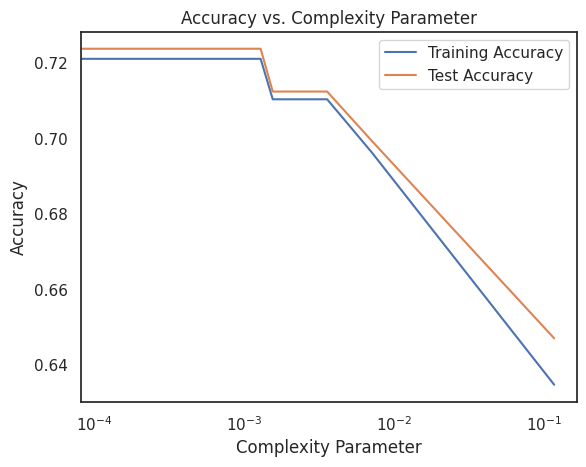

In [ ]:
# Valori di complessità candidati a essere tagliati dal modello
ccp_alphas = path.ccp_alphas

# Addestra l'albero decisionale con diversi valori di complessità
train_accuracy = []
test_accuracy = []
for complexity in ccp_alphas:
    tree_pca = DecisionTreeClassifier(max_depth=3, ccp_alpha=complexity)
    tree_pca.fit(X_train_pca, y_train_pca)
    train_accuracy.append(tree_pca.score(X_train_pca, y_train_pca))
    test_accuracy.append(tree_pca.score(X_test_pca, y_test_pca))

# Plotta l'accuratezza del modello in funzione del parametro di complessità
plt.plot(ccp_alphas, train_accuracy, label='Training Accuracy')
plt.plot(ccp_alphas, test_accuracy, label='Test Accuracy')
plt.xlabel('Complexity Parameter')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Complexity Parameter')
plt.xscale('log')
plt.legend()
plt.show()

In [ ]:
# Inizzializzazione di una lista vuota per memorizzare i modelli addestrati
clfs = []

# Iterazione attraverso i valori di complessità dei costi
for ccp_alpha in ccp_alphas:
  # Creazione e addestramento di un modello di albero decisionale con il valore alpha corrente
  tree_pca = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
  tree_pca.fit(X_train_pca, y_train_pca)
  clfs.append(tree_pca)
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
      clfs[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.11735577440370965


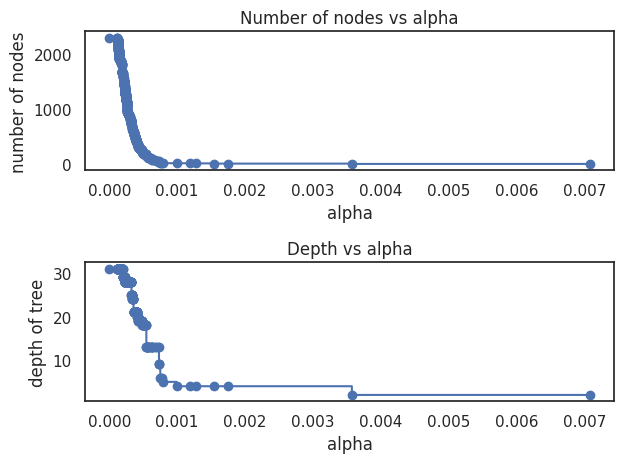

In [ ]:
# Rimozione dell'ultimo modello addestrato e del relativo valore alpha
clfs = clfs[:-1]
complexity_values = ccp_alphas[:-1]

# Estrazione del numero di nodi e della profondità per ciascun modello
node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]

fig, ax = plt.subplots(2, 1)
# Grafico del numero di nodi rispetto al valore alpha
ax[0].plot(complexity_values, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
# Grafico del valore della profondità rispetto al valore alpha
ax[1].plot(complexity_values, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

In [ ]:
decision_tree = DecisionTreeClassifier()

# Studiando i grfici sopra abbiamo selezionato una serie di parametri da testare
param_grid = {
    'max_depth': [3, 5, 7],
    'ccp_alpha': [0.0001, 0.0002, 0.0004, 0.0006, 0.0008, 0.001, 0.002, 0.004, 0.006, 0.008]
}

# Ricerca con i parametri selezionati
grid_search = GridSearchCV(estimator=decision_tree, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train_pca, y_train_pca)

best_params_pca = grid_search.best_params_
best_score = grid_search.best_score_

# Stampiamo i risultati
print(best_params_pca)
print(best_score)

{'ccp_alpha': 0.001, 'max_depth': 5}
0.7195714285714285


In [ ]:
# Potiamo l'albero con i migliri parametri trovati da GridSearch
tree_pca = DecisionTreeClassifier(max_depth=best_params_pca['max_depth'], ccp_alpha=best_params_pca['ccp_alpha'])
start_time = time()
tree_pca.fit(X_train_pca, y_train_pca)
end_time = time()
DecisionTreePCA_training_time = end_time - start_time

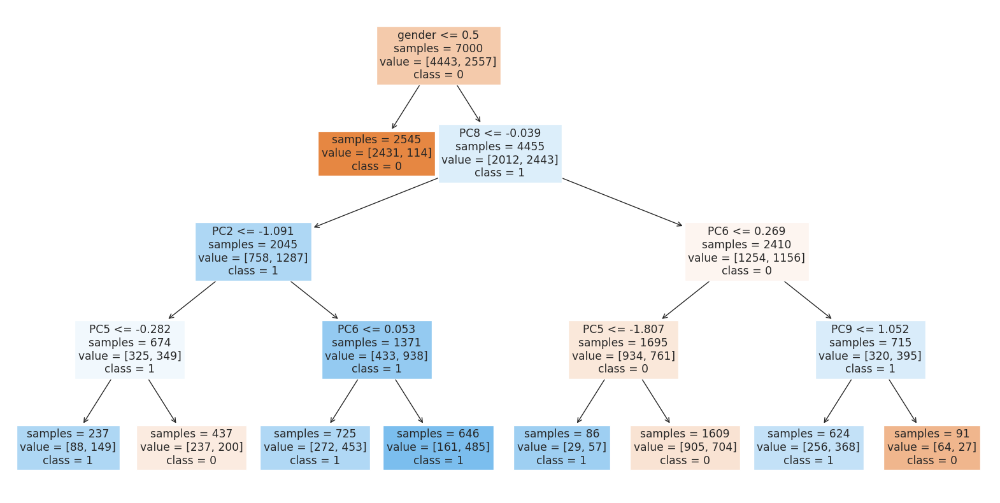

Test Set Performance:
              precision    recall  f1-score   support

           0       0.78      0.81      0.79      1941
           1       0.62      0.58      0.60      1059

    accuracy                           0.73      3000
   macro avg       0.70      0.70      0.70      3000
weighted avg       0.73      0.73      0.73      3000



In [ ]:
# Stampiamo il nuovo albero e le sue performance dopo il pruning
fig, ax = plt.subplots(figsize=(20, 10))
plot_tree(tree_pca,
          feature_names=X_train_pca.columns,
          class_names=[str(x) for x in tree_pca.classes_],
          filled=True,
          ax=ax,
          impurity=False)

plt.show()

y_pred = tree_pca.predict(X_test_pca)

cm_tree_pca = confusion_matrix(y_test_pca, y_pred)

print("Test Set Performance:")
print(classification_report(y_test_pca, y_pred))

<Axes: >

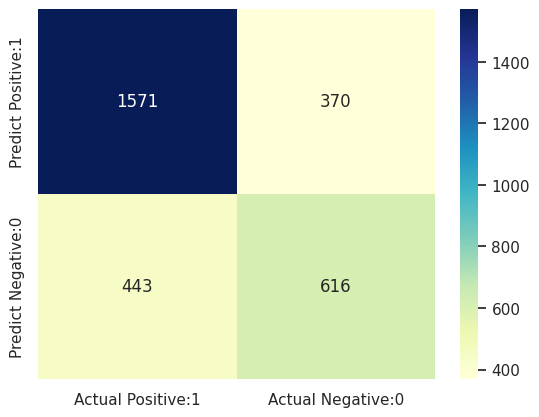

In [ ]:
# Stampiamo la matrice di confusione
cm_matrix = pd.DataFrame(data=cm_tree_pca, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

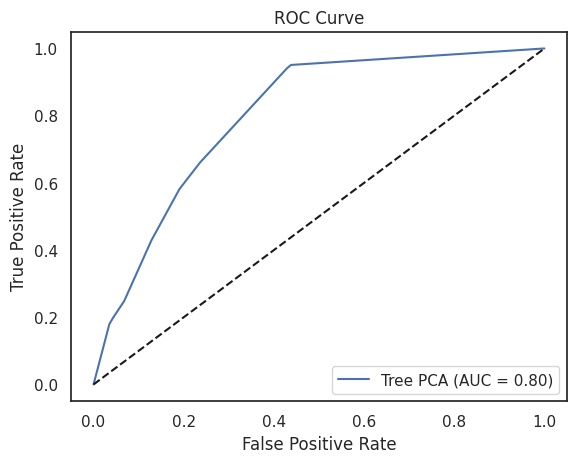

In [ ]:
# Calcoliamo le probabilità predette per la classe positiva
y_pred_prob_tree_pca = tree_pca.predict_proba(X_test_pca)[:,-1]

# Calcoliamo la curva ROC e l'AUC relativo all'albero appena addestrato
fpr_tree_pca, tpr_tree_pca, thresholds_tree_pca = roc_curve(y_test_pca, y_pred_prob_tree_pca)
auc_tree_pca = roc_auc_score(y_test_pca, y_pred_prob_tree_pca)

# Plottiamo la curva ROC del modello
plt.plot(fpr_tree_pca, tpr_tree_pca, label=f'Tree PCA (AUC = {auc_tree_pca:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
# Tempo di training dell'albero dopo il pruning
print(f'Tempo di training DecisionTree con PCA: {DecisionTreePCA_training_time:.3f} secondi')

Tempo di training DecisionTree con PCA: 0.052 secondi


###NN con PCA

In [ ]:
X_train_pca.shape

(7000, 12)

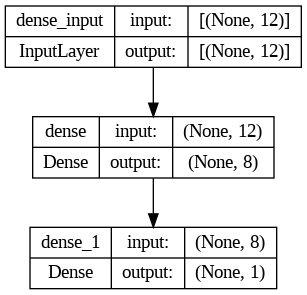

In [ ]:
# Costruiamo la rete neurale
nnpca_model = Sequential()
nnpca_model.add(Dense(8, input_shape=(12,), activation='relu'))
nnpca_model.add(Dense(1, activation='sigmoid'))

# Compiliamo il modello
nnpca_model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

keras.utils.plot_model(nnpca_model, show_shapes=True)

In [ ]:
# Addestriamo il modello
start_time = time()
nnpca_model.fit(X_train_pca, y_train_pca, epochs=50, batch_size=10, verbose=1, validation_data=(X_test_pca, y_test_pca))
end_time = time()
NNPCA_training_time = end_time - start_time

# Eseguiamo la valutazione sul test set
score = nnpca_model.evaluate(X_test_pca, y_test_pca, verbose=0)

print('Test loss:', score[0])
print('Test accuracy:', score[1])

Epoch 1/50
700/700 [==============================] - 3s 3ms/step - loss: 0.6080 - accuracy: 0.6271 - val_loss: 0.5127 - val_accuracy: 0.7193
Epoch 2/50
700/700 [==============================] - 2s 3ms/step - loss: 0.5098 - accuracy: 0.7089 - val_loss: 0.4902 - val_accuracy: 0.7313
Epoch 3/50
700/700 [==============================] - 2s 2ms/step - loss: 0.4963 - accuracy: 0.7201 - val_loss: 0.4828 - val_accuracy: 0.7393
Epoch 4/50
700/700 [==============================] - 2s 3ms/step - loss: 0.4904 - accuracy: 0.7246 - val_loss: 0.4802 - val_accuracy: 0.7447
Epoch 5/50
700/700 [==============================] - 2s 3ms/step - loss: 0.4864 - accuracy: 0.7279 - val_loss: 0.4789 - val_accuracy: 0.7450
Epoch 6/50
700/700 [==============================] - 2s 3ms/step - loss: 0.4845 - accuracy: 0.7304 - val_loss: 0.4778 - val_accuracy: 0.7413
Epoch 7/50
700/700 [==============================] - 2s 3ms/step - loss: 0.4824 - accuracy: 0.7311 - val_loss: 0.4772 - val_accuracy: 0.7390
Epoch 

In [ ]:
# Facciamo le predizioni sul test set
y_pred = nnpca_model.predict(X_test_pca)
y_pred_binary = np.round(y_pred)

# Calcoliamo la matrice di confusione
cm = confusion_matrix(y_test_pca, y_pred_binary)

# Stampiamo il classification report
print("Test Set Performance:")
print(classification_report(y_test_pca, y_pred_binary))

94/94 [==============================] - 0s 2ms/step
Test Set Performance:
              precision    recall  f1-score   support

           0       0.84      0.75      0.79      1941
           1       0.62      0.74      0.67      1059

    accuracy                           0.75      3000
   macro avg       0.73      0.74      0.73      3000
weighted avg       0.76      0.75      0.75      3000



<Axes: >

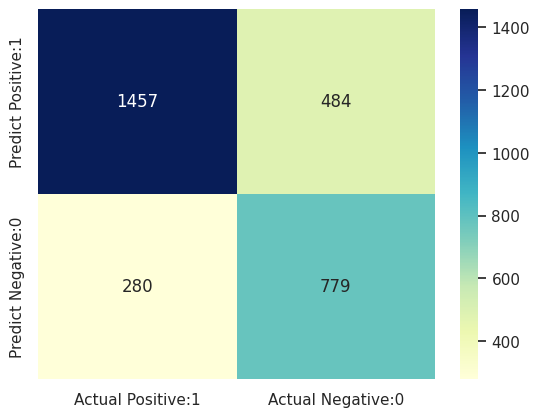

In [ ]:
# Stampiamo matrice di confusione
cm_matrix = pd.DataFrame(data=cm, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])

sns.heatmap(cm_matrix, annot=True, fmt='d', cmap='YlGnBu')

94/94 [==============================] - 0s 2ms/step


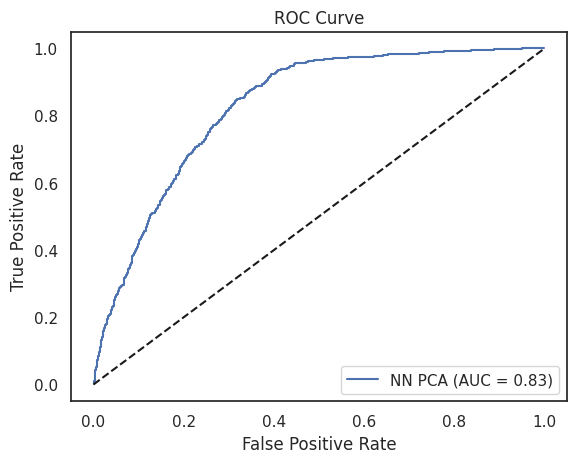

In [ ]:
# Calcoliamo le probabilità di predizione della rete neurale
y_pred_prob_pca = nnpca_model.predict(X_test_pca)

# Calcoliamo i valori necessari per la costruzione della curva ROC relativa al modello
fpr_pca, tpr_pca, thresholds_pca = roc_curve(y_test_pca, y_pred_prob_pca)
auc_pca = roc_auc_score(y_test_pca, y_pred_prob_pca)

# Plottiamo la curva ROC del modello
plt.plot(fpr_pca, tpr_pca, label=f'NN PCA (AUC = {auc_pca:.2f})')
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

In [ ]:
# Tempo di training della rete
print(f'Tempo di training NN con PCA: {NNPCA_training_time:.3f} secondi')

Tempo di training NN con PCA: 93.261 secondi


Si conclude ora la parte di addestramento dei modelli e procediamo con la validazione dei modelli tramite Stratified Cross Validation

##Stratified Cross Validation

Facciamo ora la cross-validation per entrambi i modelli. Abbiamo scelto di utilizzare stratified cross-validation poiché le classi dell'attributo "smoking" sono sbilanciate.

In [ ]:
# Numero di fold scelti per la cross-validation
n_fold = 5

folds = StratifiedKFold(n_splits=n_fold, shuffle=True)

In [ ]:
# Impostiamo come target l'attributo 'target' (uguale a 'smoking') del dataset con PCA
y_pca=df_pca['target']
df_pca = df_pca.drop('target', axis=1)

###Decision Tree con PCA

In [ ]:
# Inizializzaziamo alcuni array per salvare i risultati della cross-validation
accuracy_stratified_tree_pca = []
mean_tpr_tree_pca = []
mean_fpr_tree_pca = []
mean_auc_tree_pca = []

# Vogliamo calcolare una matrice di confusione totale alla fine della CV quindi partiamo inizializzando la matrice con quattro valori a 0
# Ad ogni iterazione questa matrice viene aggiornata con i nuovi valori delle predizioni
confusion_matrix_total_tree_pca = np.zeros((2,2))

start_time = time()
# Iterazione attraverso i folds della cross-validation
for n_fold, (train_idx, valid_idx) in enumerate(folds.split(df_pca, y_pca)):
  # Suddividiamo i dati in training set e validation set
  X_train_tree, X_valid_tree = df_pca.iloc[train_idx], df_pca.iloc[valid_idx]
  y_train_tree, y_valid_tree = y_pca[train_idx], y_pca[valid_idx]

  # Inizializzaziamo e addestriamo l'albero decisionale
  tree = DecisionTreeClassifier(max_depth=best_params_pca['max_depth'], ccp_alpha=best_params_pca['ccp_alpha'], random_state=42)
  tree.fit(X_train_tree, y_train_tree)

  # Predizione delle classi sul validation set
  y_pred_valid_tree = tree.predict(X_valid_tree)

  # Calcoliamo e salviamo l'accuratezza per questo fold
  accuracy_stratified_tree_pca.append(accuracy_score(y_valid_tree, y_pred_valid_tree))

  # Aggiorniamo la matrice di confuione totale con i valori dell'iterazione corrente
  confusion_matrix_fold = confusion_matrix(y_valid_tree, y_pred_valid_tree)
  confusion_matrix_total_tree_pca += confusion_matrix_fold

  # Calcoliamo i valori necessari per plottare la curva ROC e AUC
  fpr_tree_pca, tpr_tree_pca, thresholds_tree_pca = roc_curve(y_valid_tree, y_pred_valid_tree)
  auc_tree_pca = roc_auc_score(y_valid_tree, y_pred_valid_tree)

  # Interpoliamo i valori TPR e FPR per avere valori interpolati su una griglia comune
  # I dati calcolati ad ogni iterazione vengono aggiunti a degli array così da calcolare la media a fine CV
  common_fpr = np.linspace(0, 1, 100)
  interpolated_tpr_tree_pca = np.interp(common_fpr, fpr_tree_pca, tpr_tree_pca)
  mean_tpr_tree_pca.append(interpolated_tpr_tree_pca)
  mean_fpr_tree_pca.append(common_fpr)
  mean_auc_tree_pca.append(auc_tree_pca)

end_time = time()
cv_time_decisiontree_pca = end_time - start_time

# Calcoliamo la media dei valori necessari alla costruzione della curva ROC
mean_tpr_tree_pca = np.mean(mean_tpr_tree_pca, axis=0)
mean_fpr_tree_pca = np.mean(mean_fpr_tree_pca, axis=0)
mean_auc_tree_pca = np.mean(mean_auc_tree_pca)


In [ ]:
# Stampiamo i vari valori di accuratezza ottenuti per ogni fold
accuracy_stratified_tree_pca

[0.7245, 0.709, 0.724, 0.7145, 0.7135]

In [ ]:
# Utilizziamo la funzione st.t.interval per calcolare l'intervallo di confidenza al 90% per la media del campione di dati accuracy_stratified_tree
interval_tree_pca = st.t.interval(confidence=0.90, df=len(accuracy_stratified_tree_pca)-1, loc=np.mean(accuracy_stratified_tree_pca), scale=st.sem(accuracy_stratified_tree_pca))
interval_tree_pca

(0.7105690986065477, 0.7236309013934522)

###Neural Network con PCA

In [ ]:
# Inizializzaziamo alcuni array per salvare i risultati della cross-validation
accuracy_stratified_nn_pca = []
mean_tpr_nn_pca = []
mean_fpr_nn_pca = []
mean_auc_nn_pca = []

# Vogliamo calcolare una matrice di confusione totale alla fine della CV quindi partiamo inizializzando la matrice con quattro valori a 0
# Ad ogni iterazione questa matrice viene aggiornata con i nuovi valori delle predizioni
confusion_matrix_total_nn_pca = np.zeros((2,2))

start_time = time()
# Iterazione attraverso i folds della cross-validation
for n_fold, (train_idx, valid_idx) in enumerate(folds.split(df_pca, y_pca)):
  # Suddividiamo i dati in training set e validation set
  X_train_nn_pca, X_valid_nn_pca = df_pca.iloc[train_idx], df_pca.iloc[valid_idx]
  y_train_nn_pca, y_valid_nn_pca = y_pca[train_idx], y_pca[valid_idx]

  # Costruzioniamo e addestriamo la NN
  nn_pca = Sequential()
  nn_pca.add(Dense(8, input_shape=(12,), activation='relu'))
  nn_pca.add(Dense(1, activation='sigmoid'))

  nn_pca.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

  nn_pca.fit(X_train_nn_pca, y_train_nn_pca, epochs=50, batch_size=10, verbose=1, validation_data=(X_valid_nn_pca, y_valid_nn_pca))

  # Predizione delle classi sul validation set
  y_pred_valid_nn_pca = nn_pca.predict(X_valid_nn_pca)
  y_prediction = np.round(y_pred_valid_nn_pca)

  #  Calcoliamo e salviamo l'accuratezza per questo fold
  accuracy = accuracy_score(y_valid_nn_pca, y_prediction)
  accuracy_stratified_nn_pca.append(accuracy)

  # Aggiorniamo la matrice di confusione totale con i valori dell'iterazione corrente
  confusion_matrix_fold = confusion_matrix(y_valid_nn_pca, y_prediction)
  confusion_matrix_total_nn_pca += confusion_matrix_fold

  # Calcoliamo i valori necessari per plottare la curva ROC e AUC
  fpr_nn_pca, tpr_nn_pca, thresholds_nn_pca = roc_curve(y_valid_nn_pca, y_pred_valid_nn_pca)
  auc_nn_pca = roc_auc_score(y_valid_nn_pca, y_pred_valid_nn_pca)

  # Interpoliamo i valori TPR e FPR per avere valori interpolati su una griglia comune
  common_fpr_pca = np.linspace(0, 1, 100)
  interpolated_tpr_nn_pca = np.interp(common_fpr_pca, fpr_nn_pca, tpr_nn_pca)
  mean_tpr_nn_pca.append(interpolated_tpr_nn_pca)
  mean_fpr_nn_pca.append(common_fpr_pca)
  mean_auc_nn_pca.append(auc_nn_pca)

end_time = time()
cv_time_nn_pca = end_time - start_time

# Calcoliamo la media dei valori necessari alla costruzione della curva ROC
mean_tpr_nn_pca = np.mean(mean_tpr_nn_pca, axis=0)
mean_fpr_nn_pca = np.mean(mean_fpr_nn_pca, axis=0)
mean_auc_nn_pca = np.mean(mean_auc_nn_pca)


Epoch 1/50
800/800 [==============================] - 2s 2ms/step - loss: 0.5840 - accuracy: 0.6641 - val_loss: 0.5365 - val_accuracy: 0.6895
Epoch 2/50
800/800 [==============================] - 2s 2ms/step - loss: 0.5112 - accuracy: 0.7114 - val_loss: 0.5189 - val_accuracy: 0.7085
Epoch 3/50
800/800 [==============================] - 2s 2ms/step - loss: 0.4971 - accuracy: 0.7231 - val_loss: 0.5111 - val_accuracy: 0.7090
Epoch 4/50
800/800 [==============================] - 2s 2ms/step - loss: 0.4893 - accuracy: 0.7349 - val_loss: 0.5055 - val_accuracy: 0.7185
Epoch 5/50
800/800 [==============================] - 2s 2ms/step - loss: 0.4846 - accuracy: 0.7374 - val_loss: 0.5024 - val_accuracy: 0.7215
Epoch 6/50
800/800 [==============================] - 2s 3ms/step - loss: 0.4814 - accuracy: 0.7379 - val_loss: 0.5008 - val_accuracy: 0.7245
Epoch 7/50
800/800 [==============================] - 3s 3ms/step - loss: 0.4786 - accuracy: 0.7410 - val_loss: 0.5008 - val_accuracy: 0.7250
Epoch 

In [ ]:
# Stampiamo i vari valori di accuratezza ottenuti per ogni fold
accuracy_stratified_nn_pca

[0.7235, 0.735, 0.7405, 0.7445, 0.74]

In [ ]:
# Utilizziamo la funzione st.t.interval per calcolare l'intervallo di confidenza al 90% per la media del campione di dati accuracy_stratified_nn_pca
interval_nn_pca = st.t.interval(confidence=0.90, df=len(accuracy_stratified_nn_pca)-1, loc=np.mean(accuracy_stratified_nn_pca), scale=st.sem(accuracy_stratified_nn_pca))
interval_nn_pca

(0.7289648913224459, 0.7444351086775539)

##Confronti

####Confronto confusion matrix

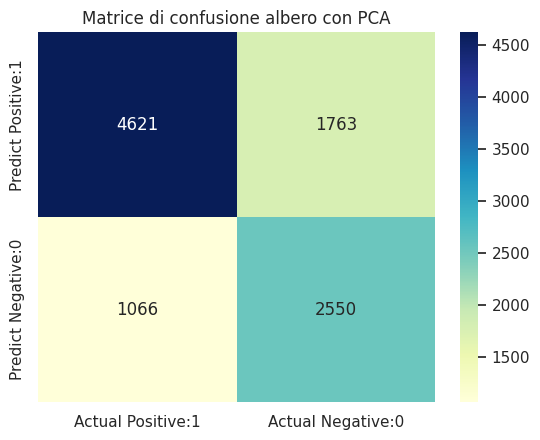

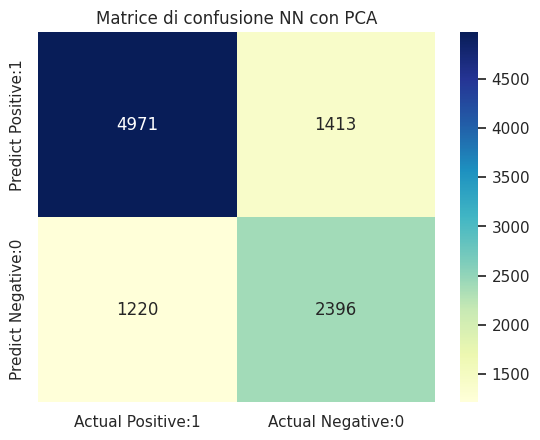

In [ ]:
# Convertiamo i valori della matrice di confusione in interi
confusion_matrix_total_tree_pca = confusion_matrix_total_tree_pca.astype(int)
confusion_matrix_total_nn_pca = confusion_matrix_total_nn_pca.astype(int)

# Creaiamo le matrici di confusione come DataFrame
cm_matrix_tree_pca = pd.DataFrame(data=confusion_matrix_total_tree_pca, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])
cm_matrix_nn_pca = pd.DataFrame(data=confusion_matrix_total_nn_pca, columns=['Actual Positive:1', 'Actual Negative:0'],
                                 index=['Predict Positive:1', 'Predict Negative:0'])


# Visualizziamo la matrice di confusione per l'albero con PCA
sns.heatmap(cm_matrix_tree_pca, annot=True, fmt='d', cmap='YlGnBu')
plt.title("Matrice di confusione albero con PCA")
plt.show()

# Visualizziamo la matrice di confusione per la rete neurale con PCA
sns.heatmap(cm_matrix_nn_pca, annot=True, fmt='d', cmap='YlGnBu')
plt.title("Matrice di confusione NN con PCA")
plt.show()


####Confronto dei modelli a seguito della Cross Validation

Confrontiamo gli intervalli di confidenza ottenuti dalla cross-validation attraverso un errorbar plot, che è un tipo di grafico utilizzato per mostrare la variabilità di un dato rispetto alla sua media. In questo contesto, mostriamo la media dell'accuratezza dei modelli e l'intervallo di confidenza associato, fornendo così una rappresentazione visiva della variabilità delle loro performance.

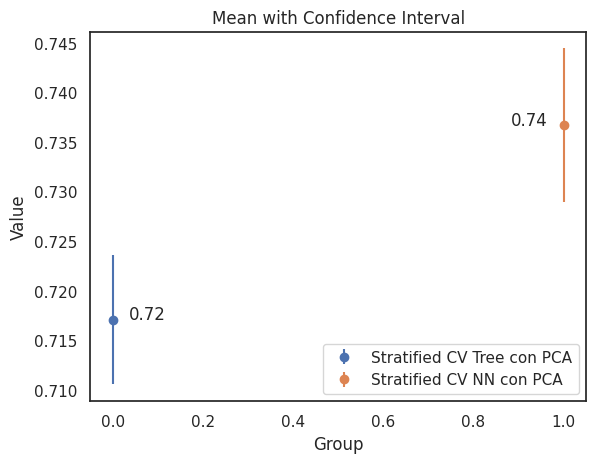

In [ ]:
# Calcoliamo la media dei valori di accuratezza ottenuti per ogni fold per il modello di albero decisionale con PCA
mean_value_tree = np.mean(accuracy_stratified_tree_pca)
interval_tree_half_width = (interval_tree_pca[1] - interval_tree_pca[0]) / 2

# Plottiamo gli intervalli di confidenza per il modello di albero decisionale con PCA
plt.errorbar(0, mean_value_tree, yerr=interval_tree_half_width, fmt='o', label='Stratified CV Tree con PCA')

# Calcoliamo e visualizziamo sul grafico il valore medio dell'intervallo dell'albero decisionale con PCA
plt.annotate(f'{mean_value_tree:.2f}', (0, mean_value_tree), textcoords="offset points", xytext=(25,0), ha='center')

# Calcoliamo la media dei valori di accuratezza ottenuti per ogni fold per il modello di NN con PCA
mean_value_nn = np.mean(accuracy_stratified_nn_pca)
interval_nn_half_width = (interval_nn_pca[1] - interval_nn_pca[0]) / 2

# Plottiamo gli intervalli di confidenza per il modello di NN con PCA
plt.errorbar(1, mean_value_nn, yerr=interval_nn_half_width, fmt='o', label='Stratified CV NN con PCA')

# Calcoliamo e visualizziamo sul grafico il valore medio dell'intervallo della rete neurale con PCA
plt.annotate(f'{mean_value_nn:.2f}', (1, mean_value_nn), textcoords="offset points", xytext=(-25,0), ha='center')

plt.xlabel('Group')
plt.ylabel('Value')
plt.title('Mean with Confidence Interval')

plt.legend(loc='lower right')

plt.show()



Confrontiamo anche i tempi di Cross-Validation

In [ ]:
print(f'Tempo di cross validation DecisionTree con PCA: {cv_time_decisiontree_pca:.3f} secondi')

print(f'Tempo di cross validation NN con PCA: {cv_time_nn_pca:.3f} secondi')

Tempo di cross validation DecisionTree con PCA: 0.475 secondi
Tempo di cross validation NN con PCA: 668.616 secondi


Confrontiamo le curve ROC dei due modelli utilizzando i valori ottenuti calcolando la media dei tassi di falsi positivi (fpr), dei tassi di veri positivi (tpr) e dell'Area Under the Curve (AUC) a partire dai valori raccolti in ogni iterazione della cross-validation per ciascun modello.

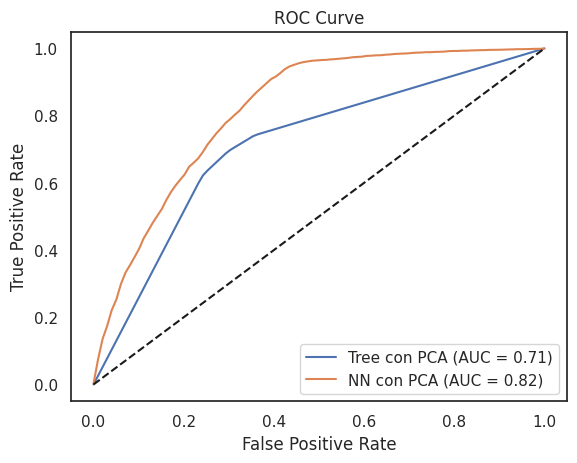

In [ ]:
# Plottiamo le curva ROC dei due modelli per comparare le performance
plt.plot(mean_fpr_tree_pca, mean_tpr_tree_pca, label=f'Tree con PCA (AUC = {mean_auc_tree_pca:.2f})')

plt.plot(mean_fpr_nn_pca, mean_tpr_nn_pca, label=f'NN con PCA (AUC = {mean_auc_nn_pca:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

**Le osservazioni sui risultati ottenuti sono riportate sulla relazione**